In [ ]:
import numpy as np
import matplotlib.pylab as plt
from numpy import math
from scipy.optimize import curve_fit
import seaborn as sns
from scipy import stats
from scipy.stats import *
import pandas as pd
from scipy.optimize import curve_fit
from scipy.optimize import minimize
!pip install emcee
!pip install corner
import emcee
import seaborn as sns
import corner
import pymc3 as pm

     |████████████████████████████████| 45 kB 1.9 MB/s 


#Modelo con priors gaussianos, y sigma uniforme

Para analizar estos parámetros se usa la librería de *pyemcee*, la cual se puede obtener un modelo usando prior gaussianos y mediante la función *pm.sample* la cual genera muestras predictivas posteriores a partir de un modelo dado

In [ ]:
"""
Funciones de la temperatura
Sky

"""
##################################0-
def T_f(v,a0,a1,a2,a3,a4):
  vc=np.median(v) #Frecuancia central
  vc=78.0 # frecuancia central (EDGES)
  return a0*(v/vc)**-2.5+a1*(v/vc)**-2.5*np.log10(v/vc)+a3*(v/vc)**-4.5+a4*(v/vc)**-2.0+a2*(v/vc)**-2.5*np.log10(v/vc)**2
def T_21(v,A,v0,w,tau):
  B=((4*(v-v0)**2)/(w**2))*(np.log10((-1/tau)*np.log10((1+(np.e**(-tau)))/2)))
  return-A*(1-(np.e**(-tau*(np.e)**(B))))/(1-(np.e**(-tau)))

def T_sky(v,a0,a1,a2,a3,a4,A,v0,w,tau):
  T21= T_21(v,A,v0,w,tau)
  Tf= T_f(v,a0,a1,a2,a3,a4)
  return T21+Tf
def T_sky_s(v,a0,a1,a2,a3,a4,A,v0,w,tau,sigma):
  T21= T_21(v,A,v0,w,tau)
  Tf= T_f(v,a0,a1,a2,a3,a4)
  return T21+Tf

In [ ]:
from google.colab import files
uploaded=files.upload()

Saving figure1_plotdata.csv to figure1_plotdata.csv


In [ ]:
Dat=np.loadtxt('figure1_plotdata.csv',delimiter=',',skiprows=1)
Names=np.array(['Frequency [MHz]', 'Weight', 'a: Tsky [K]', 'b: Tres1 [K]', 'c: Tres2 [K]','d: Tmodel [K]', 'e: T21 [K]'
])

In [ ]:
x,y=Dat[:,0][Dat[:,2]>0],Dat[:,2][Dat[:,2]>0] # Variables
x_C,y_C=Dat[:,0][Dat[:,0]>60.0] ,Dat[:,2][Dat[:,0]>60.0] # Variables
x_C,y_C=x_C[x_C<94.0],y_C[x_C<94.0]

#Modelo pyemcee con distribuciones Gaussianas

El conjunto de datos a examinar es el mismo que se trabajo en el archivo $\texttt{Modelos_emcee.ipynb}$

In [ ]:
# los datos de estas constantes estan el kelvin, al igual que los datos tomados de EDGES

#Bow=1570.0/1000, 700.0/1000,-1100.0/1000,750.0/1000,-175.0/1000,0.567,78.3,20.75,800.0,0.05

Bow= 1570, 700,-1100,750,-175,0.530,78.3,20.75,8.0,0.05             # intersección con el eje y
Pyemcee= -11221.09499241, -14168.57143649, -10203.98895781,    144.62969775,12659.42909717,500.0/1000,78.3,19.0,7.0,0.05   #ajuste coeficientes de minimos cuadrados
Pyemcee2=  1743.9711358801117, 147.55004539601418, -685.8034915470453,  36.53665860684164,-196.18414188062908, 0.524285560037914, 78.6235695471557, 21.162879332114997,7.6124372729808196,0.05
Intento= -14285.22801433, -17568.34439754, -12412.45765732,    167.33842652, 15700.28024181, 0.51948421412718, 78.51820480335225, 19.32741526388625, 7.001176416303,0.05
Natu_result= -10111.419 ,-5673.739 ,-1831.621 ,150.673 ,11711.500 ,0.553, 6.78 ,78.31 ,18.74,0.05
Natu= 2000, -720,1000,-720,175,1.12,78.3,19.5,2.8,0.05
Col=['b','r','darkorange','darkmagenta','gold','g','khaki','r','indigo','teal']
Cons=np.array([Bow,Pyemcee,Pyemcee2,Intento,Natu_result,Natu])
Cons_names=np.array(['Bow','Pyemcee','Pyemcee2','Natu_result','Intento','Natu'])
names_s=np.array(['a0','a1','a2','a3','a4','A','v0','w','tau','sigma'])

#Modelos con prior gaussianas y sigma uniforme

El modelo $\texttt{pm.model()}$ realiza un ajuste de los datos usando los prior gaussianos, los cuales toman como media el valor $\mu$ el valor del conjunto de parámetro definidos anteriormente $\texttt{Cons}$, y como desviación vamos a tomar tomar un $\sigma=100$ grande, que nos permita observar  si convergen las cadenas o  si hay que ir acotando los valores de este.

El resultado de estos muestreos se puede observar mediante los gráfico de esquina al final de la celda, en donde se observa la relación entre los parámetros, y si las cadenas convergen o no.

In [ ]:
names=np.array(['a0','a1','a2','a3','a4','A','v0','w','tau'])
ds=pd.read_csv('figure1_plotdata.csv',sep=',')
ds.head()
ds2=ds[ds.iloc[:,2]>1.0]

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 287 seconds.
There were 1400 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.6552848449999132, but should be close to 0.8. Try to increase the number of tuning steps.
There were 1400 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


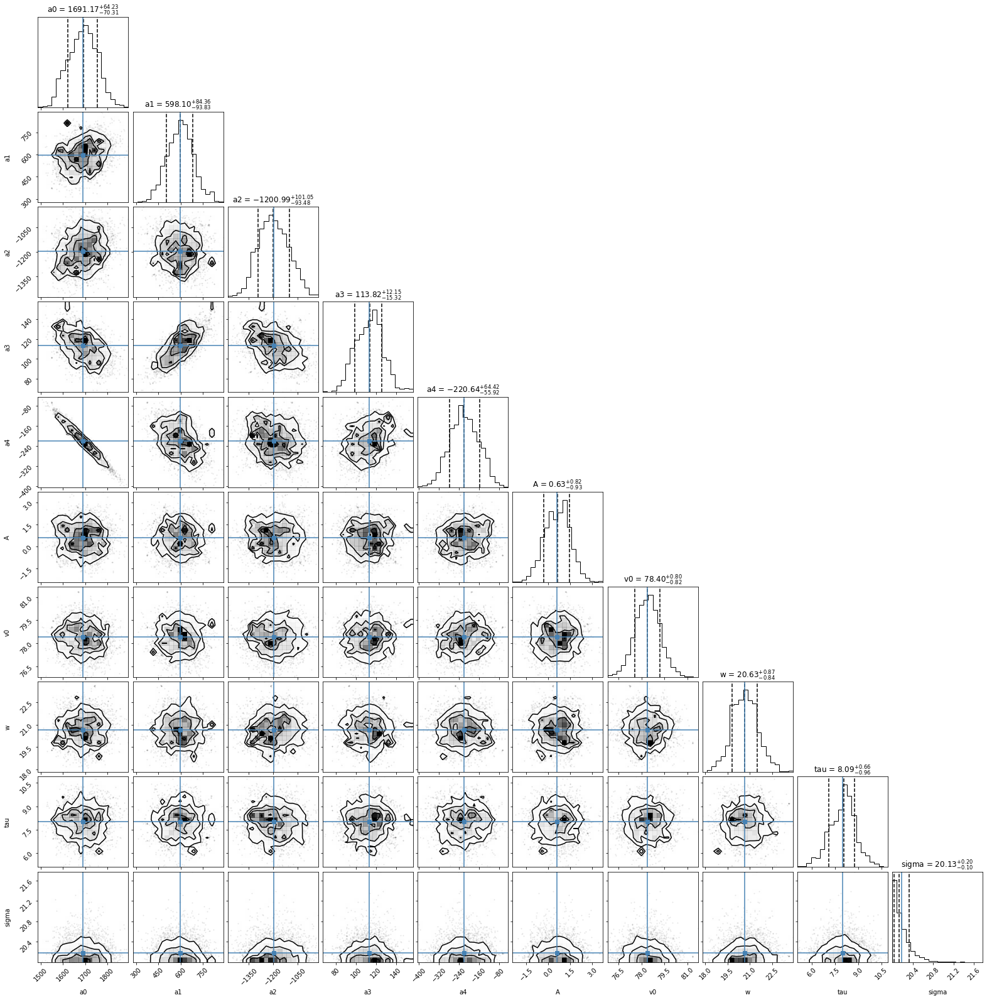

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 361 seconds.


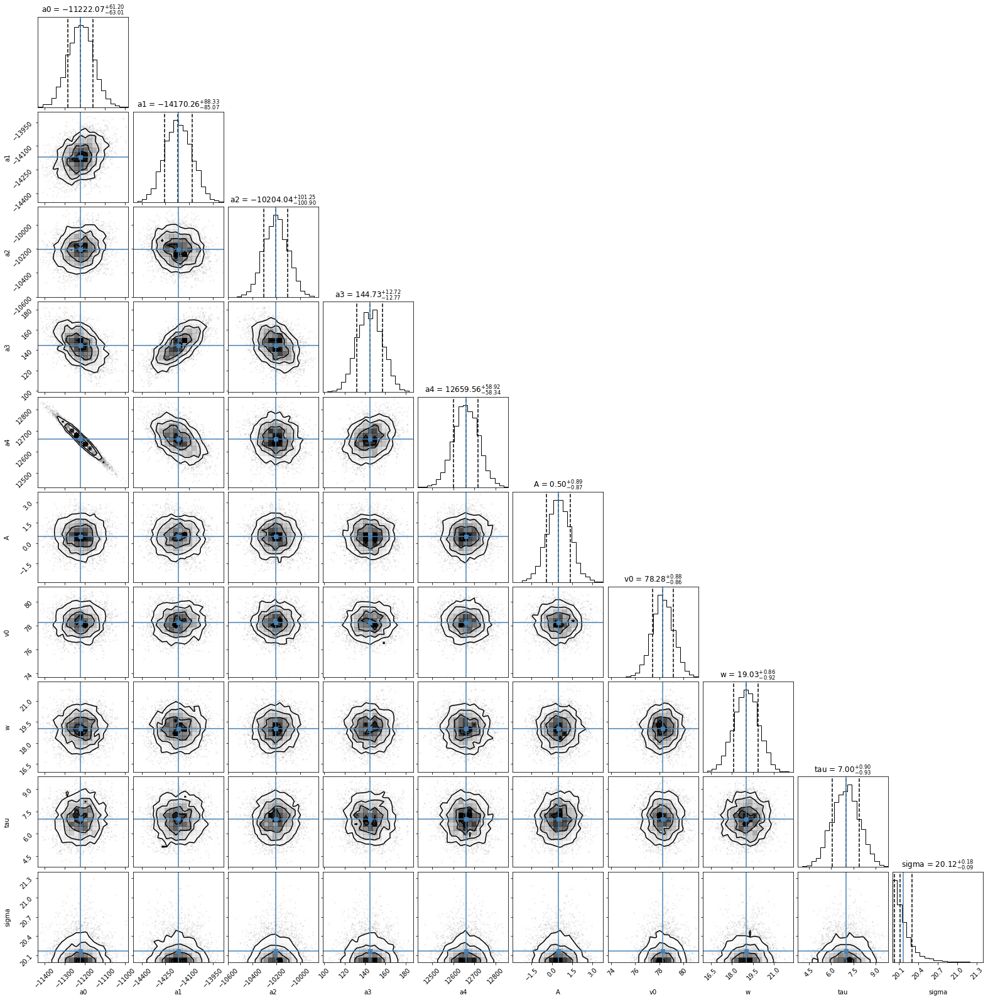

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 361 seconds.


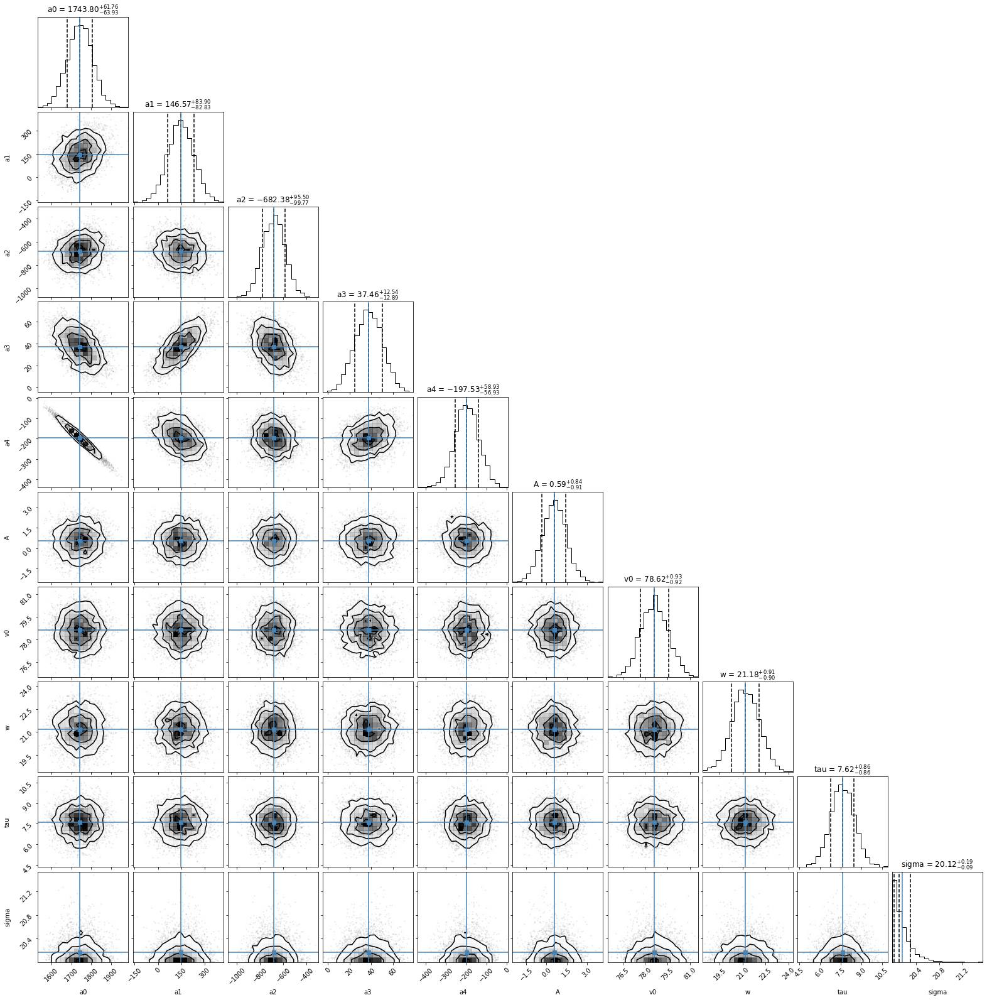

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 280 seconds.
There were 1757 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.5921010369933074, but should be close to 0.8. Try to increase the number of tuning steps.
There were 1757 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.4 for some parameters. The sampler did not converge.
The estimated number of effective samples is smaller than 200 for some parameters.


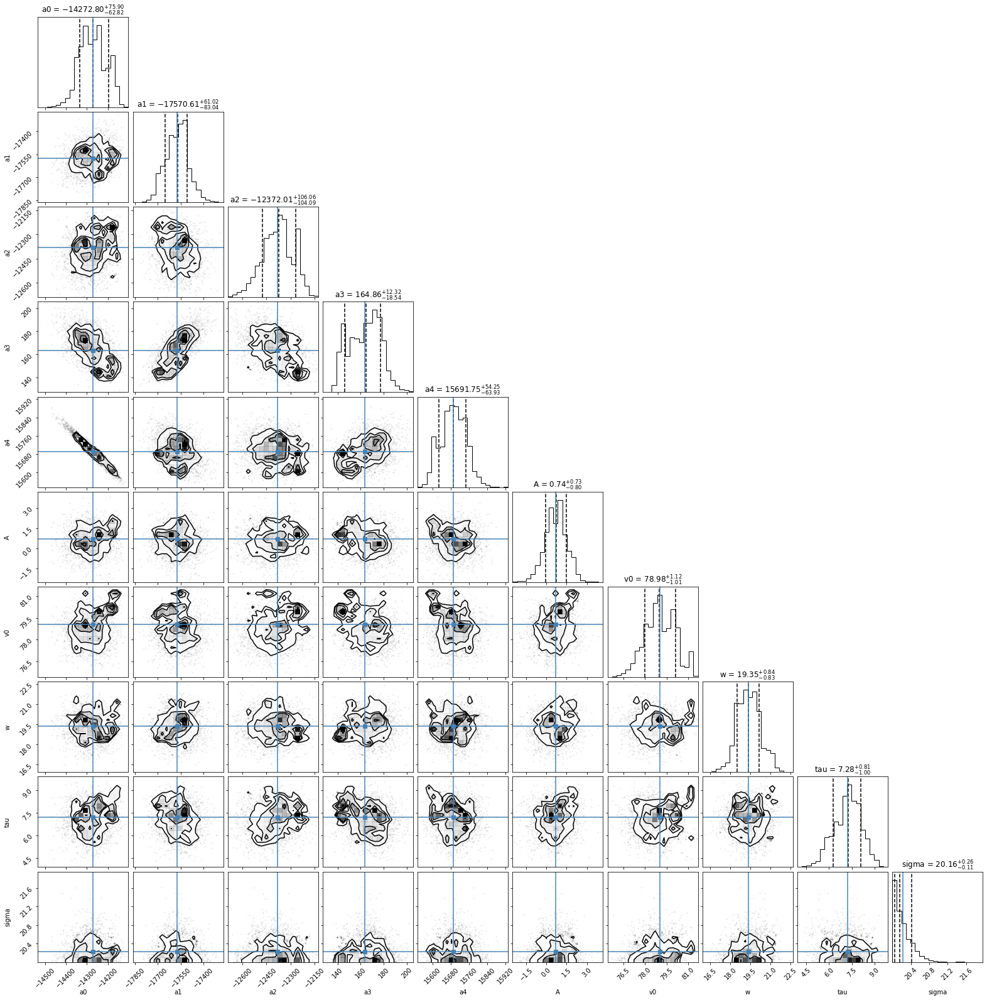

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 131 seconds.
There were 1881 divergences after tuning. Increase `target_accept` or reparameterize.
The acceptance probability does not match the target. It is 0.5938790512685261, but should be close to 0.8. Try to increase the number of tuning steps.
There were 1881 divergences after tuning. Increase `target_accept` or reparameterize.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


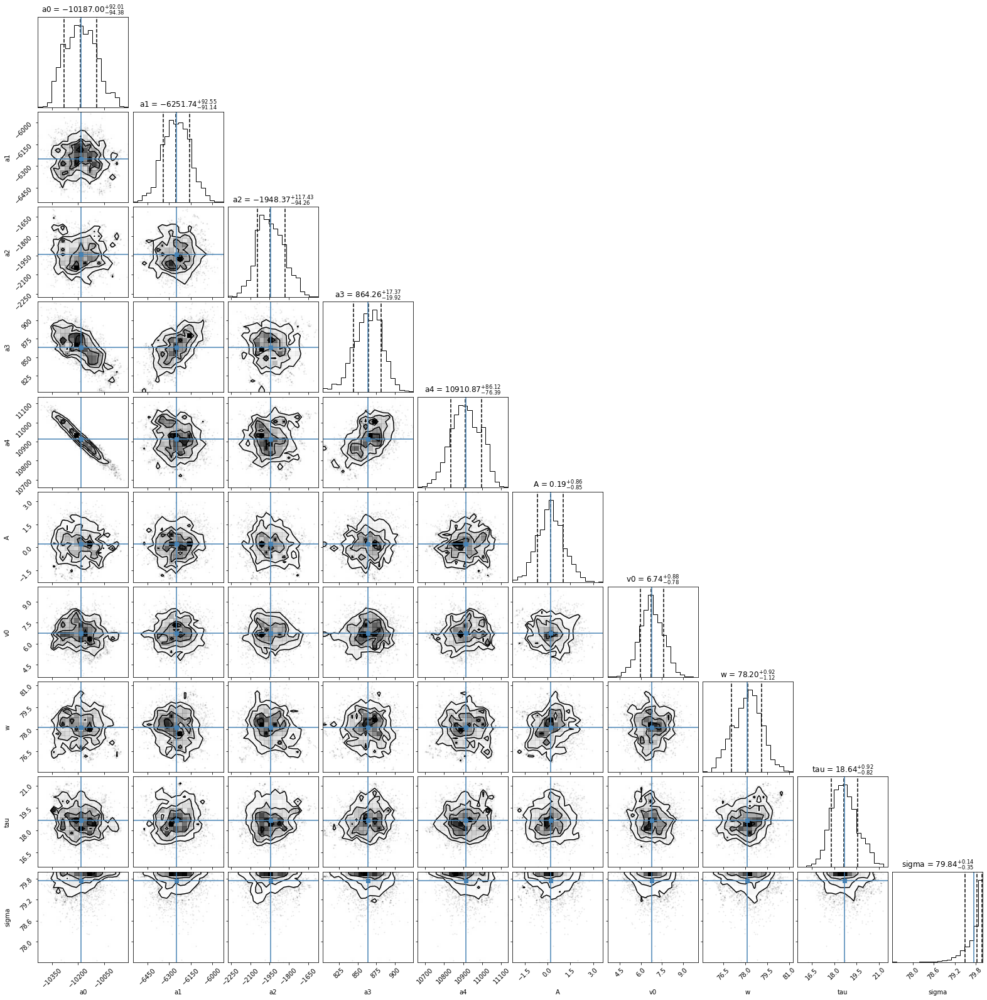

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 397 seconds.


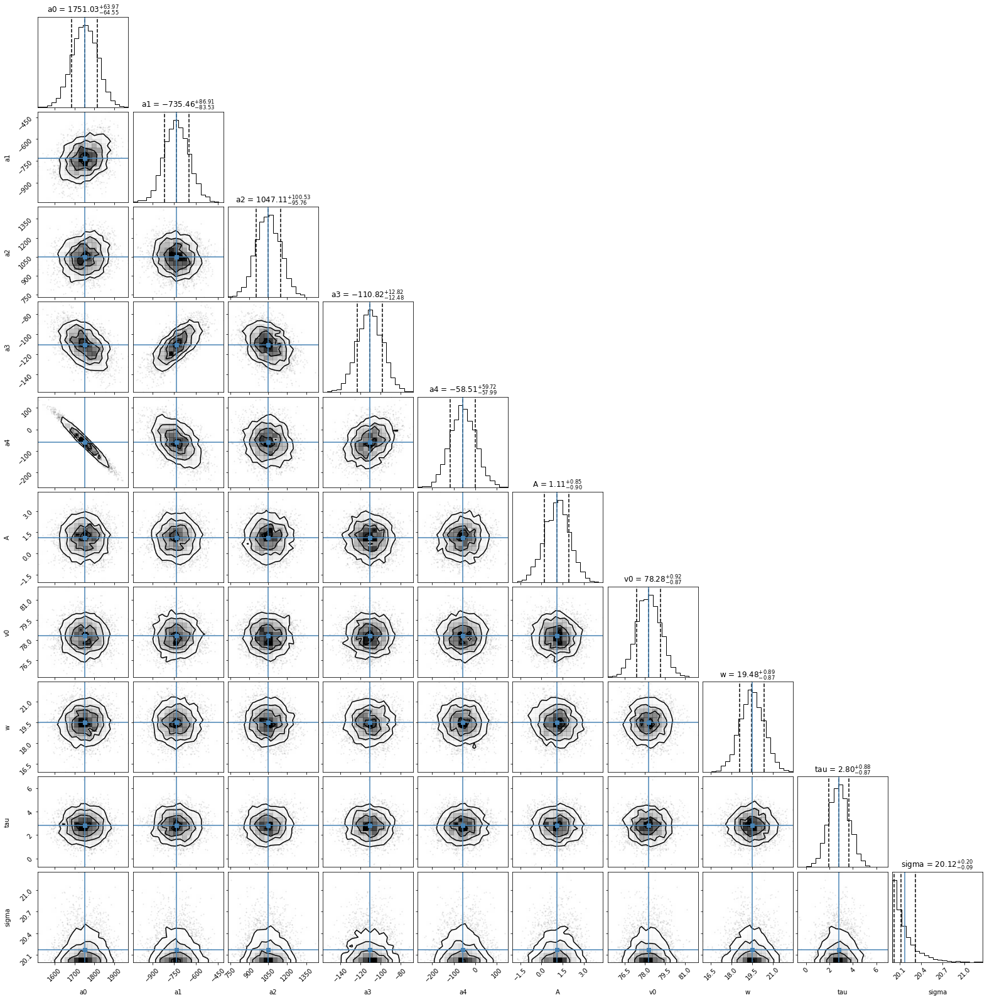

In [ ]:
d1=ds2.iloc[:,0] # Valores de frecuencia [Mhz]
d2=ds2.iloc[:,2] # Valores de la temperatura [Mk]
N=2000
Nlen=len(Cons)
cc_g2=np.zeros((len(Cons),len(Cons[0])))  # Este arreglo vacio, va a contener los valores principales de los parametros
rr_g2=np.zeros((len(Cons),2*N,len(Cons[0]))) #Este arreglo vacio va a contener los n walkers  de los parametross
#v=d1.freq-d1.freq.mean()/d1.freq.std()
v=d1#.freq
vc=78.0
for i in range(Nlen):
  a_0,a_1,a_2,a_3,a_4,A_,v_0,w_,tau_,sigma_=Cons[i]
  with pm.Model() as pred_model:
        vc=78.01
        a0=pm.Normal('a0',mu=a_0,sd=100.0)
        a1=pm.Normal('a1',mu=a_1,sd=100.0)
        a2=pm.Normal('a2',mu=a_2,sd=100.0)
        a3=pm.Normal('a3',mu=a_3,sd=100.0)
        a4=pm.Normal('a4',mu=a_4,sd=100.0)
    #    TF=(a0*(v)**-2.5+a1*(v)**-2.5*np.log10(v)+a3*(v)**-4.5+a4*(v)**-2.0+a2*(v)**-2.5*np.log10(v)**2)
        A=pm.Normal('A',mu=A_,sd=0.9)
        v0=pm.Normal('v0',mu=v_0,sd=0.9)
        w=pm.Normal('w',mu=w_,sd=0.9)
        tau=pm.Normal('tau',mu=tau_,sd=0.9)
    #    T21=-A*(1-np.e**(tau*np.e**(4*(v-v0)**2/w**2*(np.log10(-1/tau*np.log10((1+np.e**-tau)/2))))))/(1-np.e**-tau)
        B=((4*(v0-v)**2)/(w**2))*(np.log10((-1/tau)*np.log10((1+(np.e**(-tau)))/2)))
        mu=pm.Deterministic('mu',a0*(v/vc)**-2.5+a1*(v/vc)**-2.5*np.log10(v/vc)+a3*(v/vc)**-4.5+a4*(v/vc)**-2.0+a2*(v/vc)**-2.5*np.log10(v/vc)**2  -  A*(1-(np.exp(-tau*np.exp(B))))/(1-(np.e**(-tau))))
    #    mu=pm.Deterministic('mu',T_sky(v,a0,a1,a2,a3,a4,A,v0,w,tau))
        sigma=pm.Uniform('sigma',lower=20,upper=80)
        Tsky=pm.Normal('Tsky',mu=mu,sd=sigma,observed=d2)
        trace_pred=pm.sample(N,tune=N)
  filt1=np.array([np.logical_not('_interval__' in k) for k in trace_pred.varnames])
  filt2=np.array([np.logical_not('mu' in k) for k in trace_pred.varnames])
  vnames=np.array(trace_pred.varnames)[filt1&filt2] # arreglo con los nombres
  trace_array=np.array([trace_pred[i] for i in vnames]).T
  mean_pars=trace_array.mean(axis=0)

  #corner.corner(trace_array,labels=vnames,quantiles=[0.16, 0.5, 0.84],truths=mean_pars,show_titles=True)
  corner.corner(trace_array,labels=vnames,quantiles=[0.16, 0.5, 0.84],truths=trace_array.mean(axis=0),show_titles=True)
  plt.show()
  cc_g2[i]=mean_pars
  rr_g2[i]=trace_array

#Ajustes Nwalkers

La muestra anterior tiene un conjunte de $4000$ walkers que ajustan de forma coherente los datos de $\text{Tsky}$, como se ve en la siguiente grafica para cada conjunto de parámetros

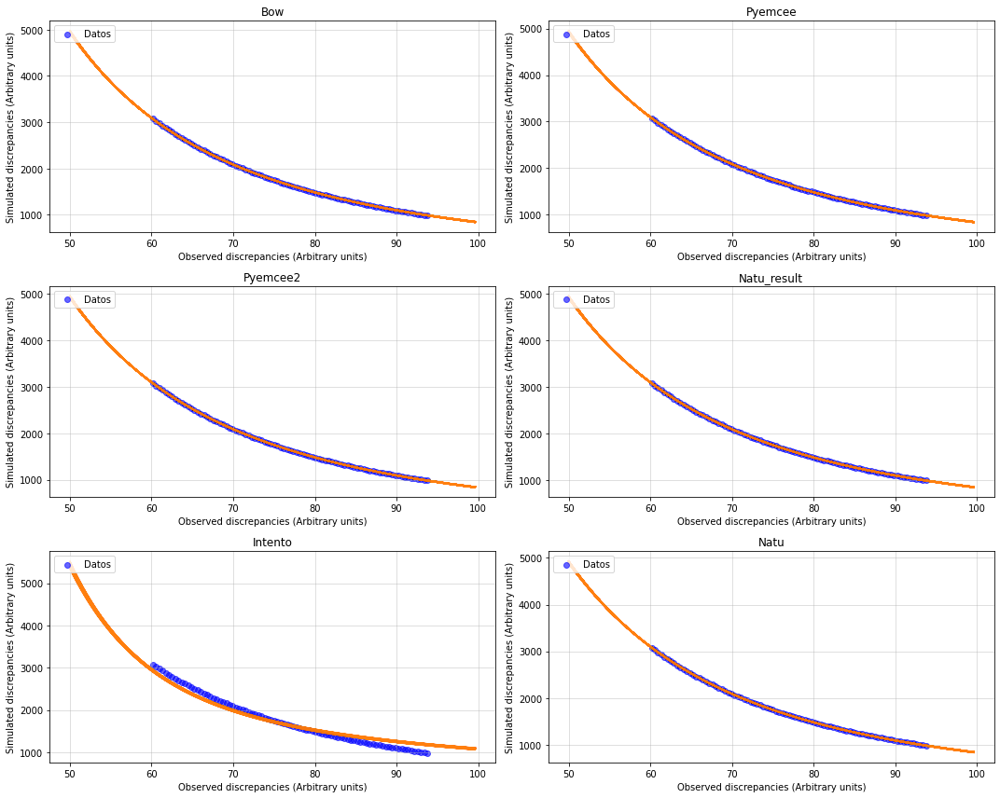

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=2,figsize=(15, 12))
for ii, ax in enumerate(axes.flat, start=0):

  for i in range(len(rr_g2[0,:,:])):
    ax.plot(Dat[:,0],T_sky_s(Dat[:,0],*rr_g2[ii,i,:]), "C1", alpha=0.1)
  ##Grafica la muetras con su respectivo error

  ax.scatter(x_C,y_C,alpha=0.6,color='b',label='Datos')
  ax.legend(loc='upper left',frameon=True)
  ax.set_xlabel('Observed discrepancies (Arbitrary units)')
  ax.set_ylabel('Simulated discrepancies (Arbitrary units)')
  ax.set_title(Cons_names[ii])
  ax.grid(alpha=0.5)
  fig.tight_layout()
plt.show()

#Discrepancia

Después de tener en muestreo de las función posterior, obtenidas con $\textit{pyemcee}$ y de verificar que los datos ajustan la señal de Tsky,  se prueba si el los datos sinteticos obtenidos mediante el modelo, discrepan de los datos observados.

En la siguiente función se usa el criterio de Tully Fischer para comparar los datos que obtuvimos de nuestro muestreo con los observados y hacer una gráfico de ellos y arrojar el valor del parámetro de discrepancia $p$

In [ ]:
def disc_sg2(ii,samples,x,y):
  #arreglos vacios para guardad los valores de la discrepancia simulada y observada
  discs=[]
  disco=[]

  rej=0 ## Tasa de rechazo
  #samples=rr_g[ii,:,:]#parametros
  #yexp=(samples[i,0]*x+samples[i,3])**2+samples[i,1]**2
  #yexp=np.sqrt(yexp)
  #samples[:,0]
  n_100=len(samples)//1 # Candtidad de elementos a selecionar del nwalkers
  for i in range(n_100):
    # yexp es una arreglo que contiene
    #yexp=T_sky(x,samples[i,0],samples[i,1],samples[i,2],samples[i,3],samples[i,4],samples[i,5],samples[i,6],samples[i,7],samples[i,8] )
    yexp=T_sky_s(x,*samples[i])
    modpar=samples[np.random.randint(len(samples))] # Elige un conjunto de parametos de forma aleatoria de la muestra
    # Con los parametros del modelo, generamos datos sintéticos
    ymod=T_sky_s(x,*modpar) # Tsky modelo
    #ymod=np.sqrt(ymod)
    ysim=np.random.normal(ymod,abs(np.mean(rr_g2[ii,:,9]))) #Generando datos sinteticos
    if np.any(yexp<0)|np.any(ysim<0):
        rej+=1 # this checks if a negative ysim is generated
    else:
        discs+=[((np.sqrt(ysim)-np.sqrt(yexp))**2).sum()] # se guardan los valores de la discrepacia simulada (Freeman-Tukey)
        disco+=[((np.sqrt(y)-np.sqrt(yexp))**2).sum()] # Se guadan los valores de la discrepacia observada (Freeman-Tukey)
  print("Rejection rate =",100*rej//n_100,"%") #fraccion de veces que un número negativo fue generado
  if 100*rej//n_100 < 100:
      discs=np.array(discs)
      disco=np.array(disco)
      discs_g2[ii]=discs
      disco_g2[ii]=disco
      # make the discrepancy plot
      ax.scatter(disco,discs,color='darkblue',alpha=0.4,label=str(ii)+", Bayesian p-value:"+str(np.round((disco<discs).sum()*1./len(disco),2)))
      dmax=np.max(np.hstack((disco,discs)))
      dmin=np.min(np.hstack((disco,discs)))
      ppp=np.linspace(0,dmax+10,2)
      ax.plot(ppp,ppp,c='r')
      ax.set_xlim(dmin,dmax)
      ax.set_ylim(dmin,dmax)
      # the Bayesian "p-value" is the fraction of discrepancy realizations
      # when the observed discrepancy is lower than the simulated discrepancy
      # ideally this "p-value" should not be close to 0 or 1
      print("Bayesian p-value:", (disco<discs).sum()*1./len(disco))

Rejection rate = 0 %
Bayesian p-value: 1.0
Rejection rate = 0 %
Bayesian p-value: 1.0
Rejection rate = 0 %
Bayesian p-value: 1.0
Rejection rate = 0 %
Bayesian p-value: 1.0
Rejection rate = 0 %
Bayesian p-value: 0.0
Rejection rate = 0 %
Bayesian p-value: 1.0


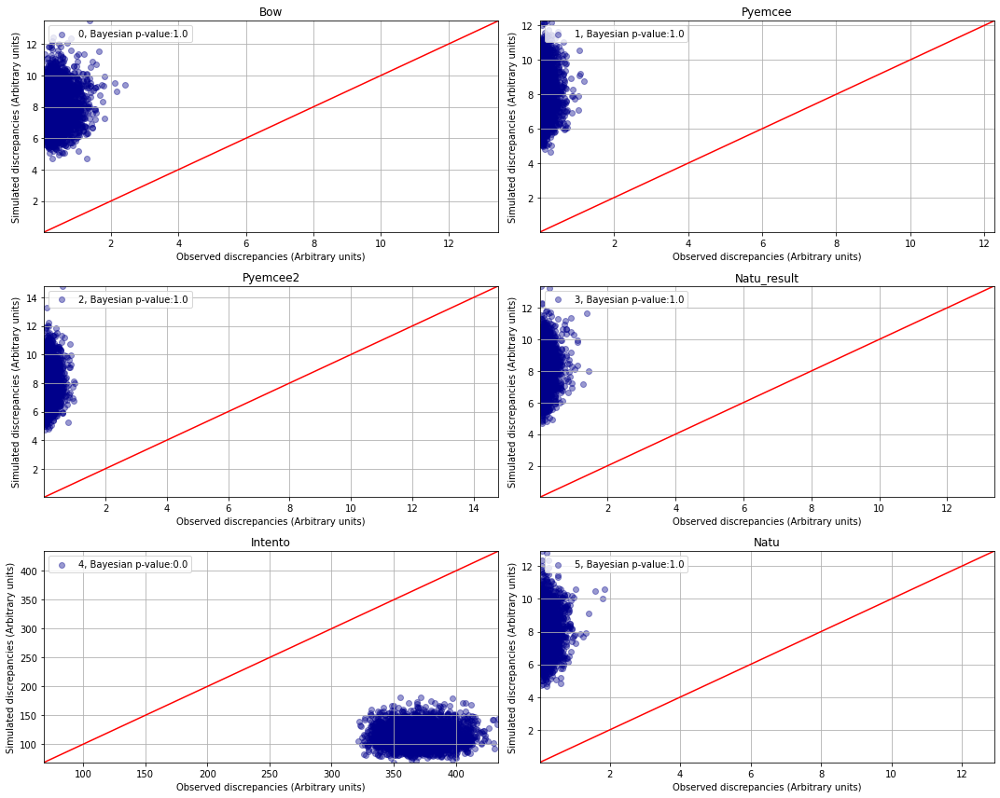

In [ ]:
discs_g2=np.zeros((len(Cons),4000))
disco_g2=np.zeros((len(Cons),4000))
fig, axes = plt.subplots(nrows=3, ncols=2,figsize=(15, 12))
for ii, ax in enumerate(axes.flat, start=0):
#for ii in range(len(Cons)):
  disc_sg2(ii,rr_g2[ii,:,:],x,y)
  ax.legend(loc='upper left',frameon=True)
  ax.set_xlabel('Observed discrepancies (Arbitrary units)')
  ax.set_ylabel('Simulated discrepancies (Arbitrary units)')
  ax.set_title(Cons_names[ii])
  ax.grid()
fig.tight_layout()

plt.show()

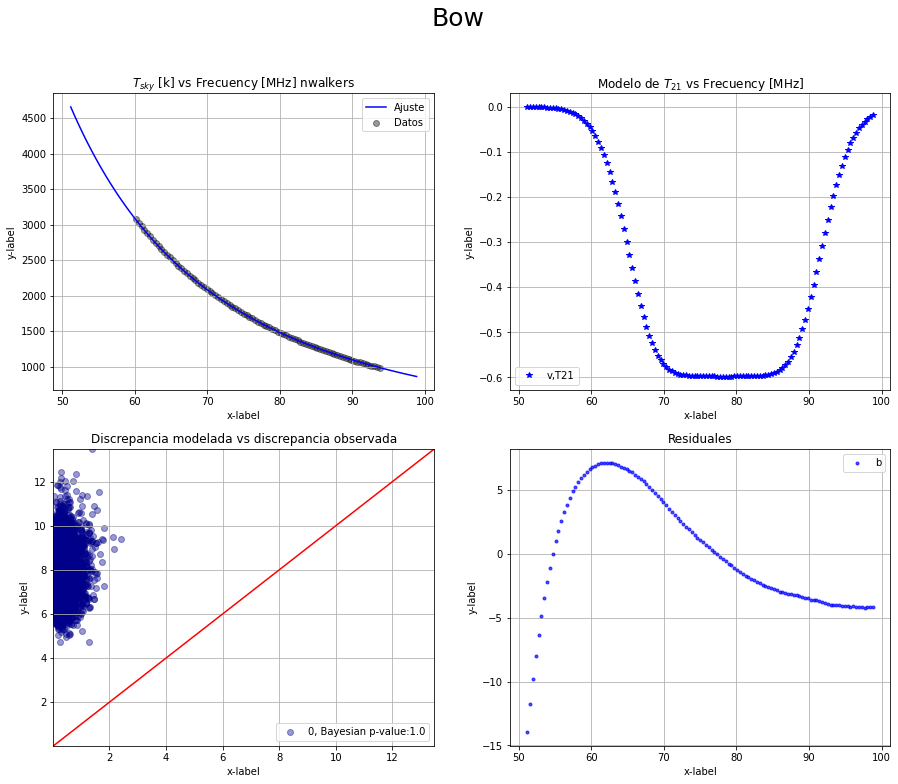

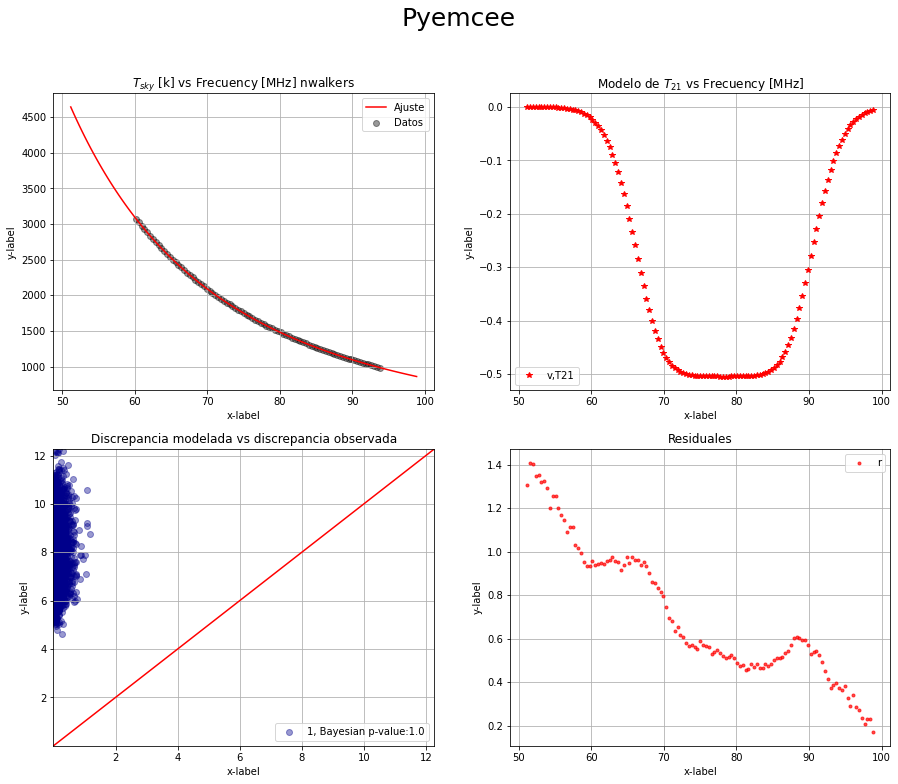

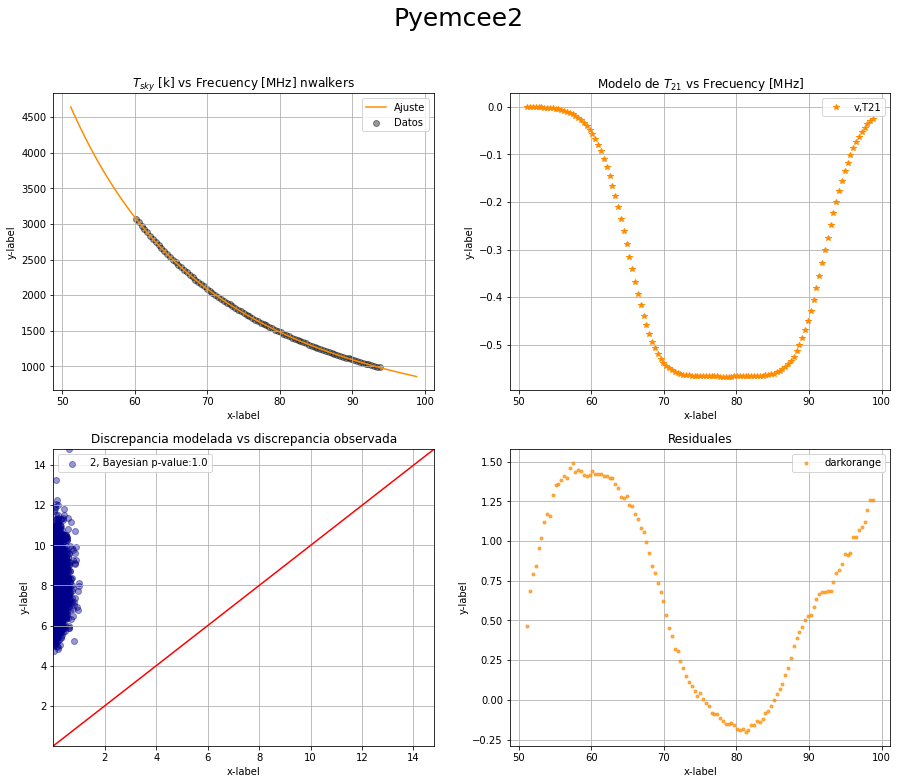

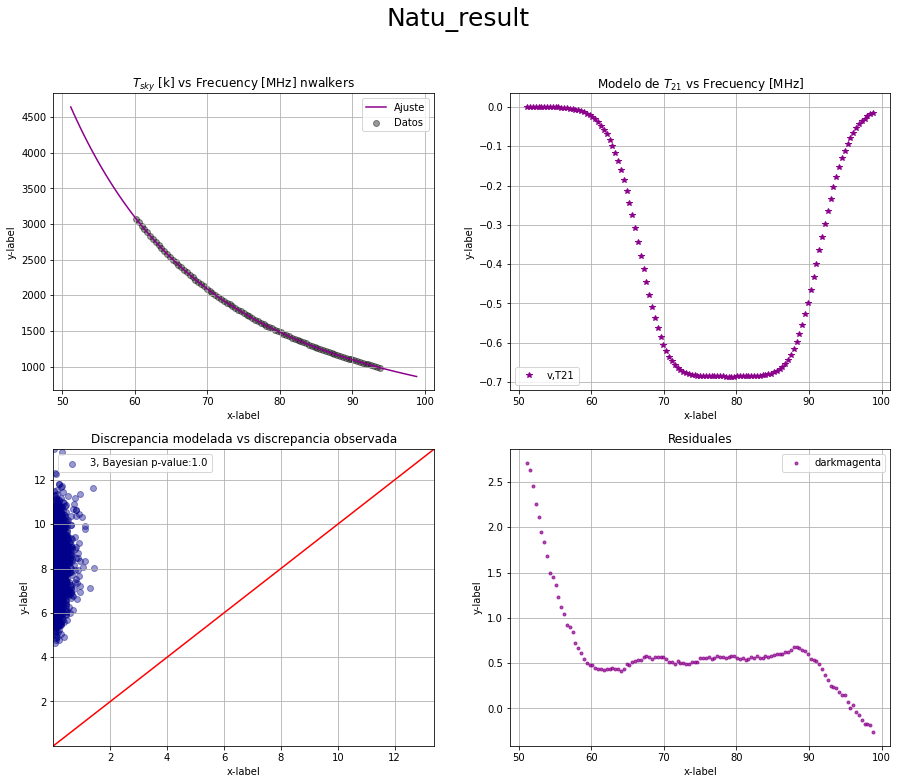

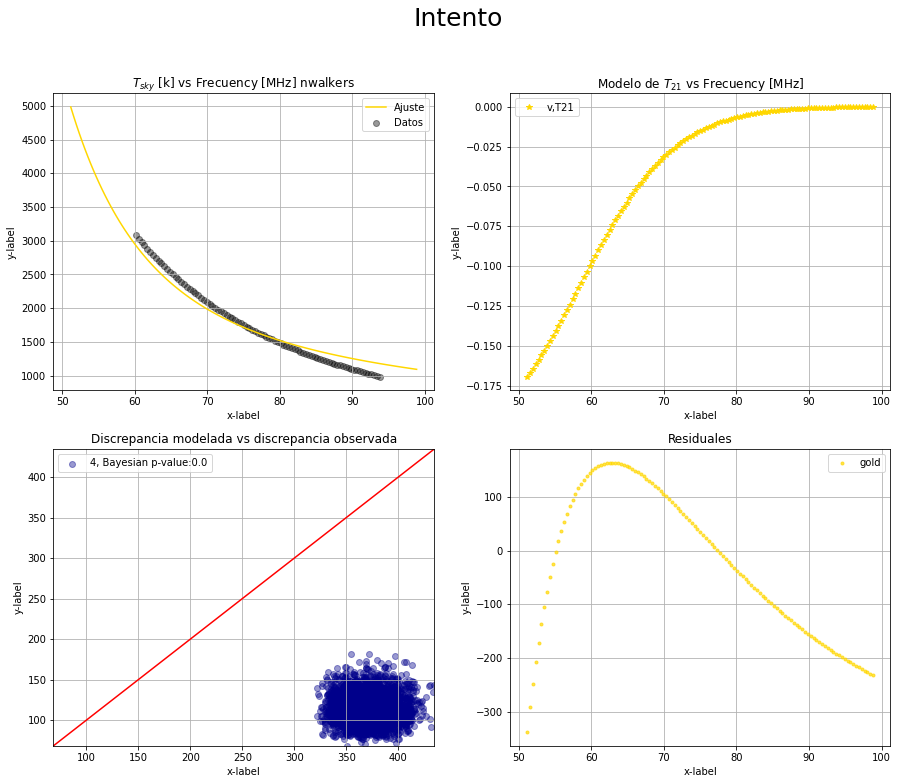

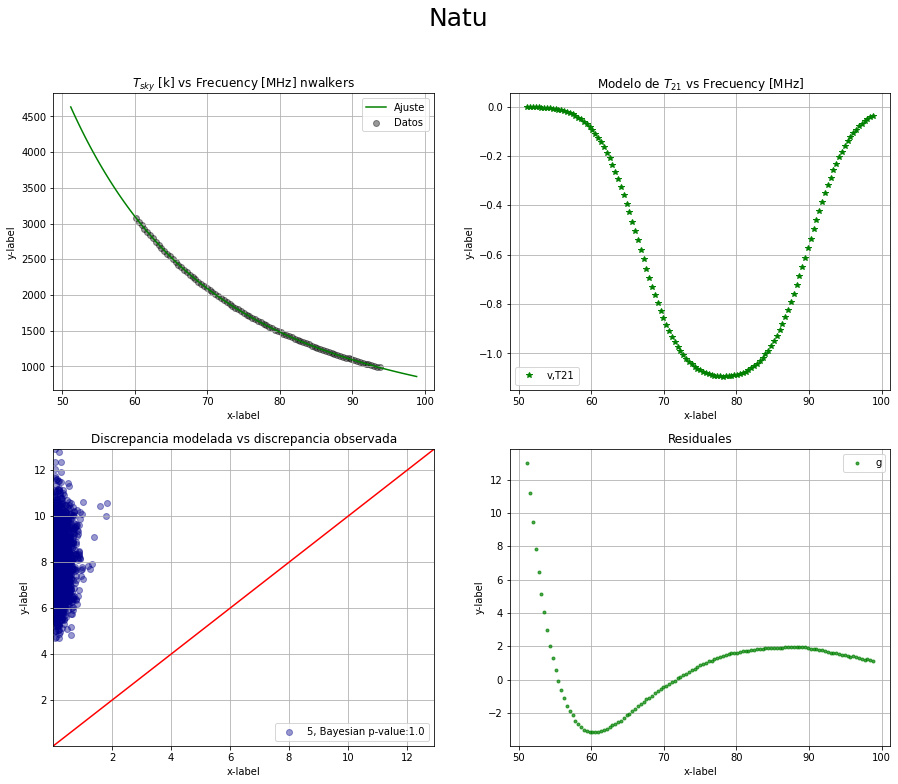

In [ ]:
for i in range(Nlen):
  fig, axs = plt.subplots(2, 2,figsize=(15, 12))
  fig.suptitle(Cons_names[i],fontsize=25)
  a0_,a1_,a2_,a3_,a4_,A1,v01,w1,tau1,sigma1=cc_g2[i]
  axs[0, 0].plot(x,T_sky_s(x,*cc_g2[i]),color=Col[i], label='Ajuste')
  axs[0, 0].scatter(x_C,y_C,color='black',alpha=0.4,label='Datos')
  axs[0, 0].set_title(r'$T_{sky}$ [k] vs Frecuency [MHz] nwalkers')


  axs[0, 1].plot(x,T_21(x,A1,v01,w1,tau1),'k*',label='v,T21',color=Col[i])
  axs[0, 1].set_title(r'Modelo de $T_{21}$ vs Frecuency [MHz]')

  axs[1, 0].scatter(disco_g2[i],discs_g2[i],color='darkblue',alpha=0.4,label=str(i)+", Bayesian p-value:"+str(np.round((disco_g2[i]<discs_g2[i]).sum()*1./len(disco_g2[i]),2)))
  dmax=np.max(np.hstack((disco_g2[i],discs_g2[i])))
  dmin=np.min(np.hstack((disco_g2[i],discs_g2[i])))
  ppp=np.linspace(0,dmax+10,2)
  axs[1, 0].plot(ppp,ppp,c='r')
  axs[1, 0].set_title('Discrepancia modelada vs discrepancia observada')
  axs[1, 0].set_xlim(dmin,dmax)
  axs[1, 0].set_ylim(dmin,dmax)


  axs[1, 1].plot(x,(y-T_sky_s(x,*cc_g2[i])),'.',alpha=0.7,color=Col[i],label=str(Col[i]))
  axs[1, 1].set_title('Residuales')

  for ax in axs.flat:
      ax.set(xlabel='x-label', ylabel='y-label')

  # Hide x labels and tick labels for top plots and y ticks for right plots.
  for ax in axs.flat:
      ax.legend()
      ax.grid()

#Conclusiones :
El ajuste de $Tsky$ es coherente, al igual que el valor de la señal de $T_21$, aunque no se tiene una buena medida de las discrepancia.

#Priors con $\sigma$ mas reducido, y desviación estándar mas reducido

El siguiente código es para observar que pasa si restringimos los valores de las prior, de modo que también se disminuya en error de los datos, y ver si se logra obtener un valor de discrepancia mejor

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 108 seconds.


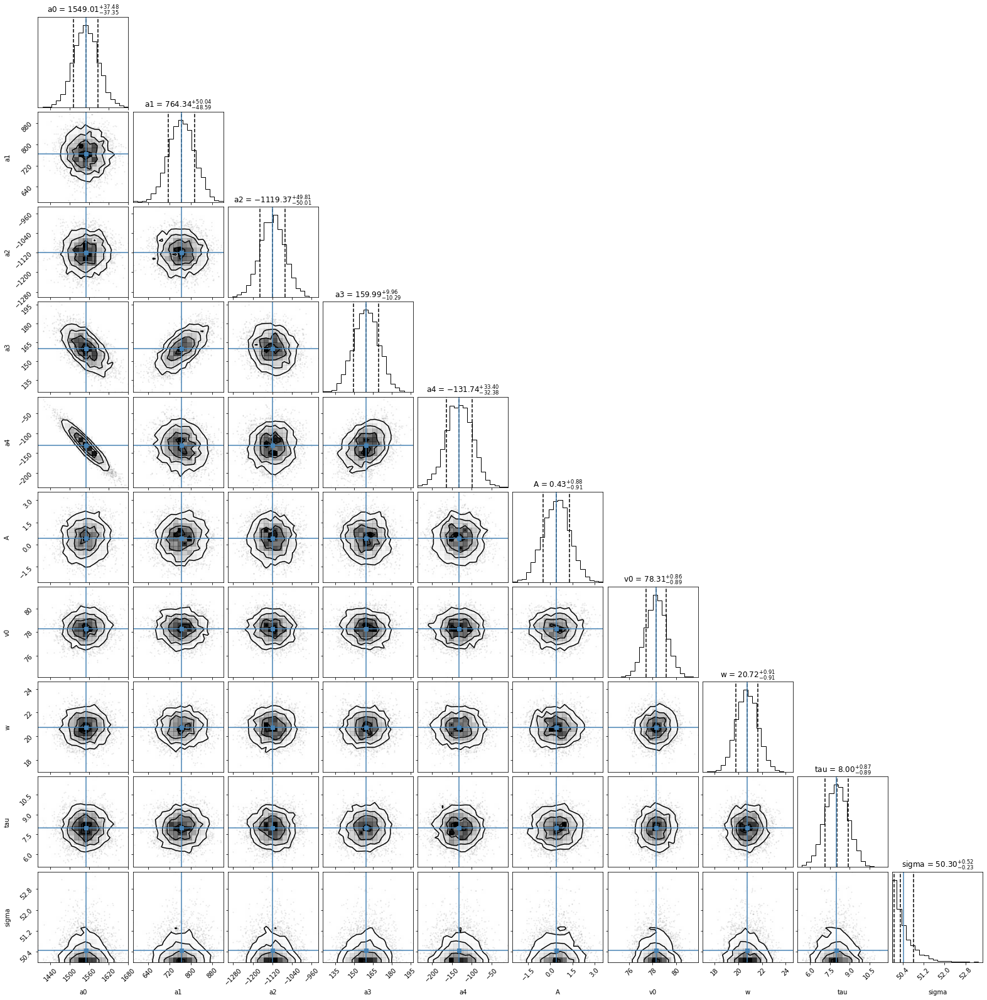

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 96 seconds.


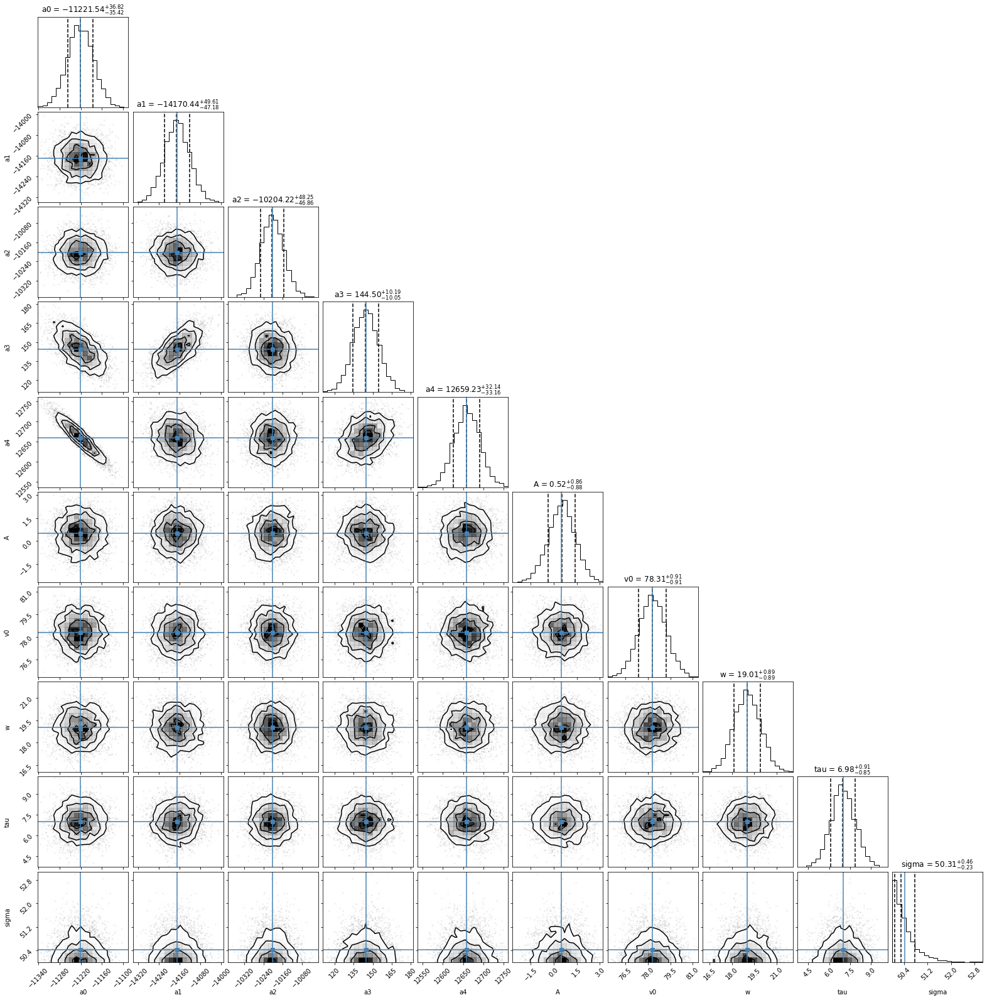

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 102 seconds.


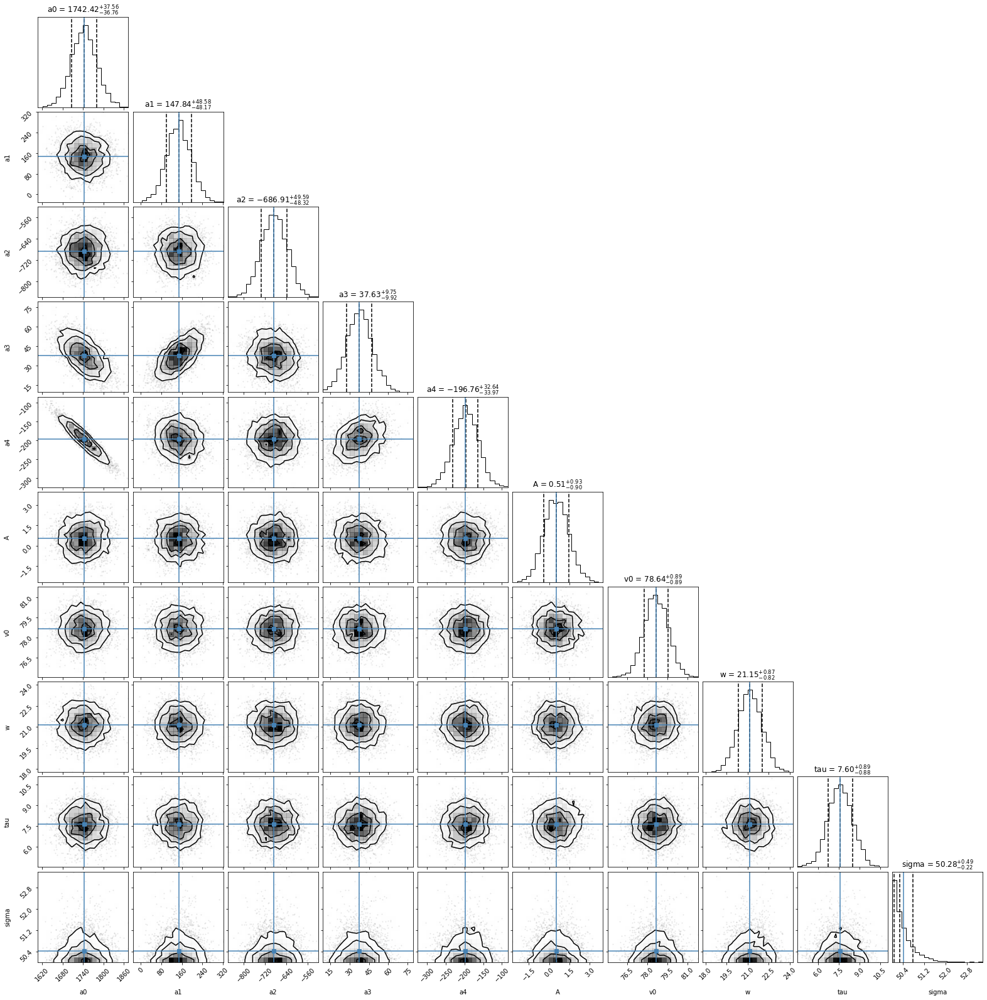

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 106 seconds.


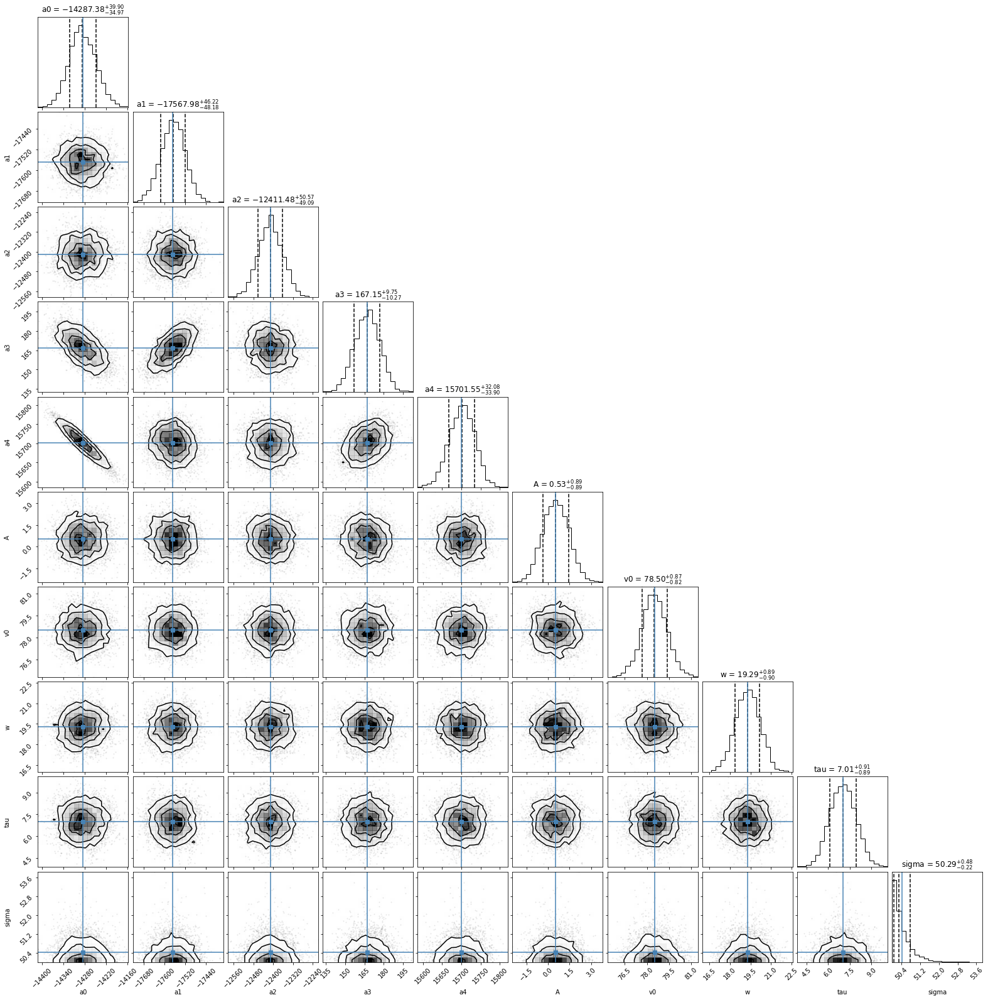

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 88 seconds.


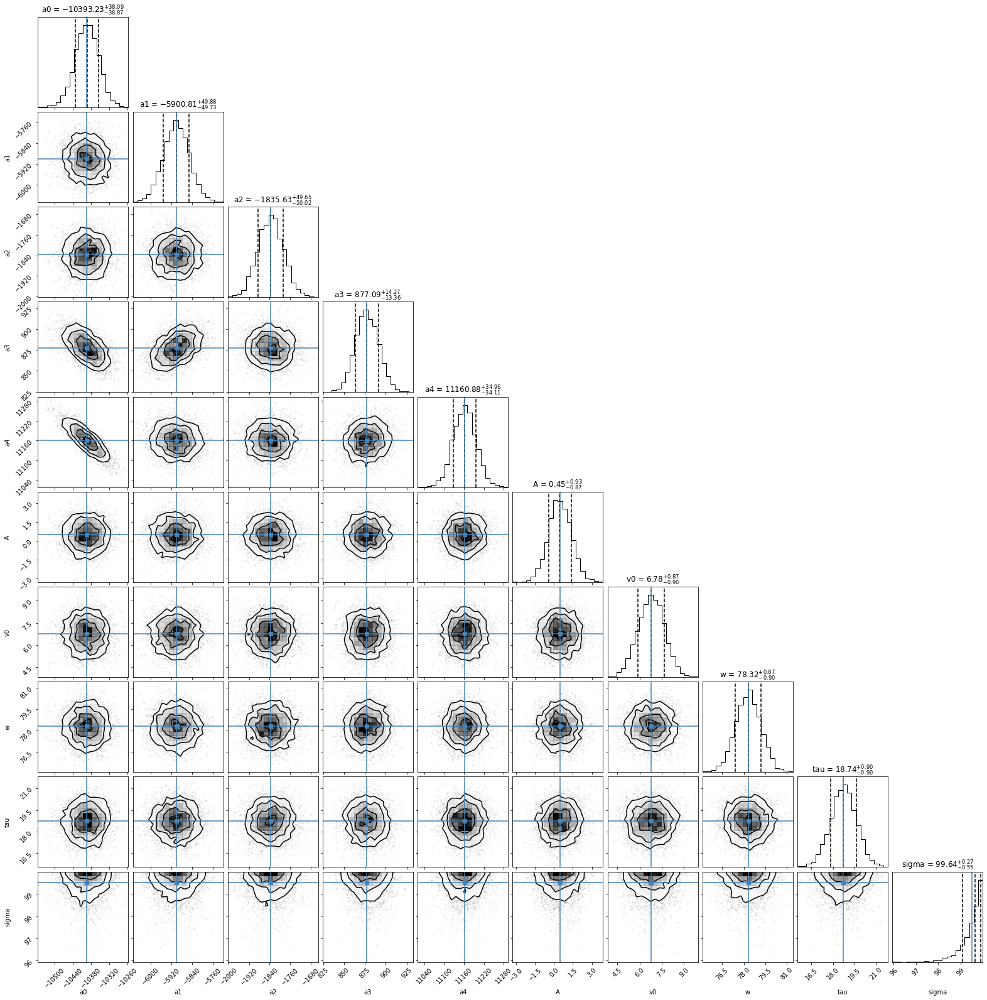

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [sigma, tau, w, v0, A, a4, a3, a2, a1, a0]


Sampling 2 chains for 2_000 tune and 2_000 draw iterations (4_000 + 4_000 draws total) took 138 seconds.


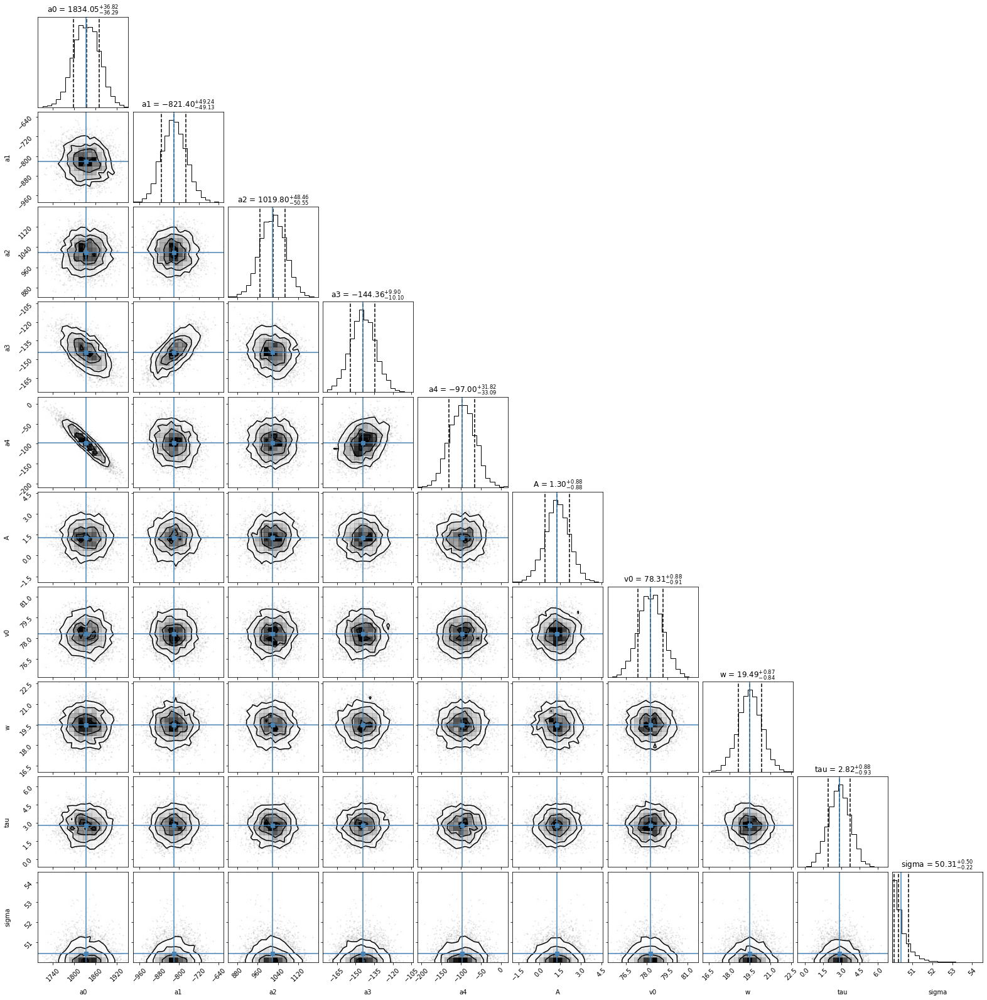

In [ ]:
d1=ds2.iloc[:,0] # Valores de frecuencia [Mhz]
d2=ds2.iloc[:,2] # Valores de la temperatura [Mk]
N=2000
cc_g3=np.zeros((len(Cons),len(Cons[0])))  # Este arreglo vacio, va a contener los valores principales de los parametros
rr_g3=np.zeros((len(Cons),2*N,len(Cons[0]))) #Este arreglo vacio va a contener los n walkers  de los parametross
#v=d1.freq-d1.freq.mean()/d1.freq.std()
v=d1#.freq
vc=78.0
for i in range(Nlen):
  a_0,a_1,a_2,a_3,a_4,A_,v_0,w_,tau_,sigma_=Cons[i]
  with pm.Model() as pred_model:
        vc=78.01
        a0=pm.Normal('a0',mu=a_0,sd=50.0)
        a1=pm.Normal('a1',mu=a_1,sd=50.0)
        a2=pm.Normal('a2',mu=a_2,sd=50.0)
        a3=pm.Normal('a3',mu=a_3,sd=50.0)
        a4=pm.Normal('a4',mu=a_4,sd=50.0)
    #    TF=(a0*(v)**-2.5+a1*(v)**-2.5*np.log10(v)+a3*(v)**-4.5+a4*(v)**-2.0+a2*(v)**-2.5*np.log10(v)**2)
        A=pm.Normal('A',mu=A_,sd=0.9)
        v0=pm.Normal('v0',mu=v_0,sd=0.9)
        w=pm.Normal('w',mu=w_,sd=0.9)
        tau=pm.Normal('tau',mu=tau_,sd=0.9)
    #    T21=-A*(1-np.e**(tau*np.e**(4*(v-v0)**2/w**2*(np.log10(-1/tau*np.log10((1+np.e**-tau)/2))))))/(1-np.e**-tau)
        B=((4*(v0-v)**2)/(w**2))*(np.log10((-1/tau)*np.log10((1+(np.e**(-tau)))/2)))
        mu=pm.Deterministic('mu',a0*(v/vc)**-2.5+a1*(v/vc)**-2.5*np.log10(v/vc)+a3*(v/vc)**-4.5+a4*(v/vc)**-2.0+a2*(v/vc)**-2.5*np.log10(v/vc)**2  -  A*(1-(np.exp(-tau*np.exp(B))))/(1-(np.e**(-tau))))
    #    mu=pm.Deterministic('mu',T_sky(v,a0,a1,a2,a3,a4,A,v0,w,tau))
        sigma=pm.Uniform('sigma',lower=50,upper=100.0)
        Tsky=pm.Normal('Tsky',mu=mu,sd=sigma,observed=d2)
        trace_pred=pm.sample(N,tune=N)
  filt1=np.array([np.logical_not('_interval__' in k) for k in trace_pred.varnames])
  filt2=np.array([np.logical_not('mu' in k) for k in trace_pred.varnames])
  vnames=np.array(trace_pred.varnames)[filt1&filt2] # arreglo con los nombres
  trace_array=np.array([trace_pred[i] for i in vnames]).T
  mean_pars=trace_array.mean(axis=0)

  #corner.corner(trace_array,labels=vnames,quantiles=[0.16, 0.5, 0.84],truths=mean_pars,show_titles=True)
  corner.corner(trace_array,labels=vnames,quantiles=[0.16, 0.5, 0.84],truths=trace_array.mean(axis=0),show_titles=True)
  plt.show()
  cc_g3[i]=mean_pars
  rr_g3[i]=trace_array

In [ ]:
def disc_sg3(ii,samples,x,y):
  #arreglos vacios para guardad los valores de la discrepancia simulada y observada
  discs=[]
  disco=[]

  rej=0 ## Tasa de rechazo
  #samples=rr_g[ii,:,:]#parametros
  #yexp=(samples[i,0]*x+samples[i,3])**2+samples[i,1]**2
  #yexp=np.sqrt(yexp)
  #samples[:,0]
  n_100=len(samples)//1 # Candtidad de elementos a selecionar del nwalkers
  for i in range(n_100):
    # yexp es una arreglo que contiene
    #yexp=T_sky(x,samples[i,0],samples[i,1],samples[i,2],samples[i,3],samples[i,4],samples[i,5],samples[i,6],samples[i,7],samples[i,8] )
    yexp=T_sky_s(x,*samples[i])
    modpar=samples[np.random.randint(len(samples))] # Elige un conjunto de parametos de forma aleatoria de la muestra
    # Con los parametros del modelo, generamos datos sintéticos
    ymod=T_sky_s(x,*modpar) # Tsky modelo
    #ymod=np.sqrt(ymod)
    ysim=np.random.normal(ymod,abs(np.mean(samples[:,9]))) #Generando datos sinteticos
    if np.any(yexp<0)|np.any(ysim<0):
        rej+=1 # this checks if a negative ysim is generated
    else:
        discs+=[((np.sqrt(ysim)-np.sqrt(yexp))**2).sum()] # se guardan los valores de la discrepacia simulada (Freeman-Tukey)
        disco+=[((np.sqrt(y)-np.sqrt(yexp))**2).sum()] # Se guadan los valores de la discrepacia observada (Freeman-Tukey)
  print("Rejection rate =",100*rej//n_100,"%") #fraccion de veces que un número negativo fue generado
  if 100*rej//n_100 < 100:
      discs=np.array(discs)
      disco=np.array(disco)
      discs_g3[ii]=discs
      disco_g3[ii]=disco
      # make the discrepancy plot
      ax.scatter(disco,discs,color='darkblue',alpha=0.4,label=str(ii)+", Bayesian p-value:"+str(np.round((disco<discs).sum()*1./len(disco),2)))
      dmax=np.max(np.hstack((disco,discs)))
      dmin=np.min(np.hstack((disco,discs)))
      ppp=np.linspace(0,dmax+10,2)
      ax.plot(ppp,ppp,c='r')
      ax.set_xlim(dmin,dmax)
      ax.set_ylim(dmin,dmax)
      # the Bayesian "p-value" is the fraction of discrepancy realizations
      # when the observed discrepancy is lower than the simulated discrepancy
      # ideally this "p-value" should not be close to 0 or 1
      print("Bayesian p-value:", (disco<discs).sum()*1./len(disco))

Rejection rate = 0 %
Bayesian p-value: 1.0
Rejection rate = 0 %
Bayesian p-value: 1.0
Rejection rate = 0 %
Bayesian p-value: 1.0
Rejection rate = 0 %
Bayesian p-value: 1.0
Rejection rate = 0 %
Bayesian p-value: 0.0
Rejection rate = 0 %
Bayesian p-value: 1.0


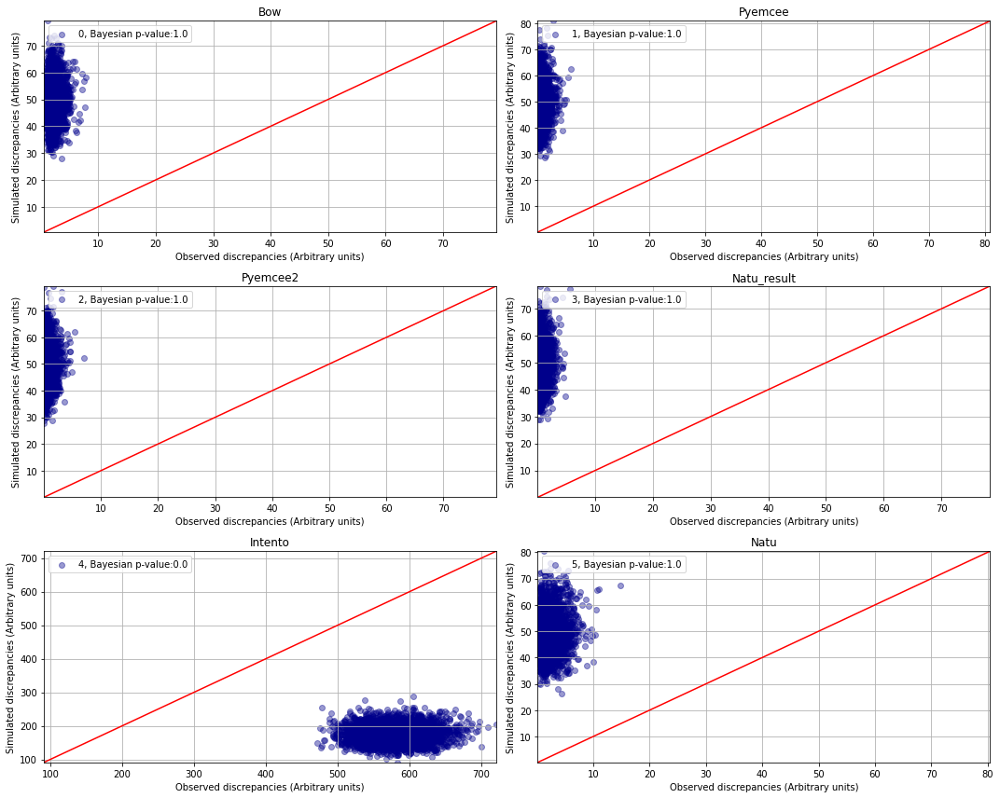

In [ ]:
discs_g3=np.zeros((len(Cons),4000))
disco_g3=np.zeros((len(Cons),4000))
fig, axes = plt.subplots(nrows=3, ncols=2,figsize=(15, 12))
for ii, ax in enumerate(axes.flat, start=0):
#for ii in range(len(Cons)):
  disc_sg3(ii,rr_g3[ii,:,:],x,y)
  ax.legend(loc='upper left',frameon=True)
  ax.set_xlabel('Observed discrepancies (Arbitrary units)')
  ax.set_ylabel('Simulated discrepancies (Arbitrary units)')
  ax.set_title(Cons_names[ii])
  ax.grid()
fig.tight_layout()

plt.show()

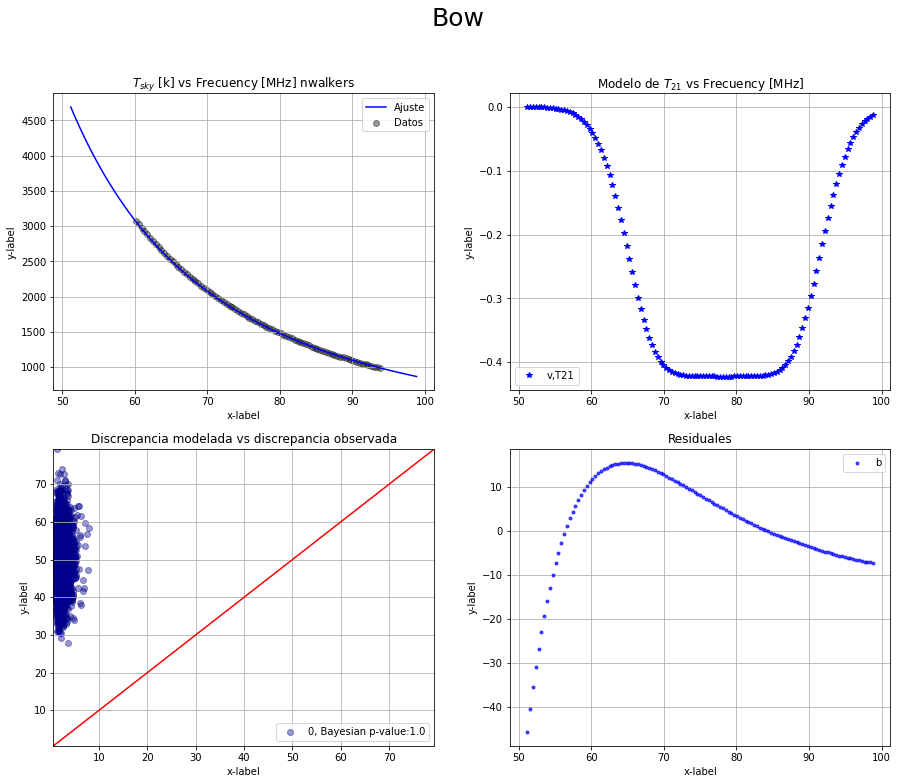

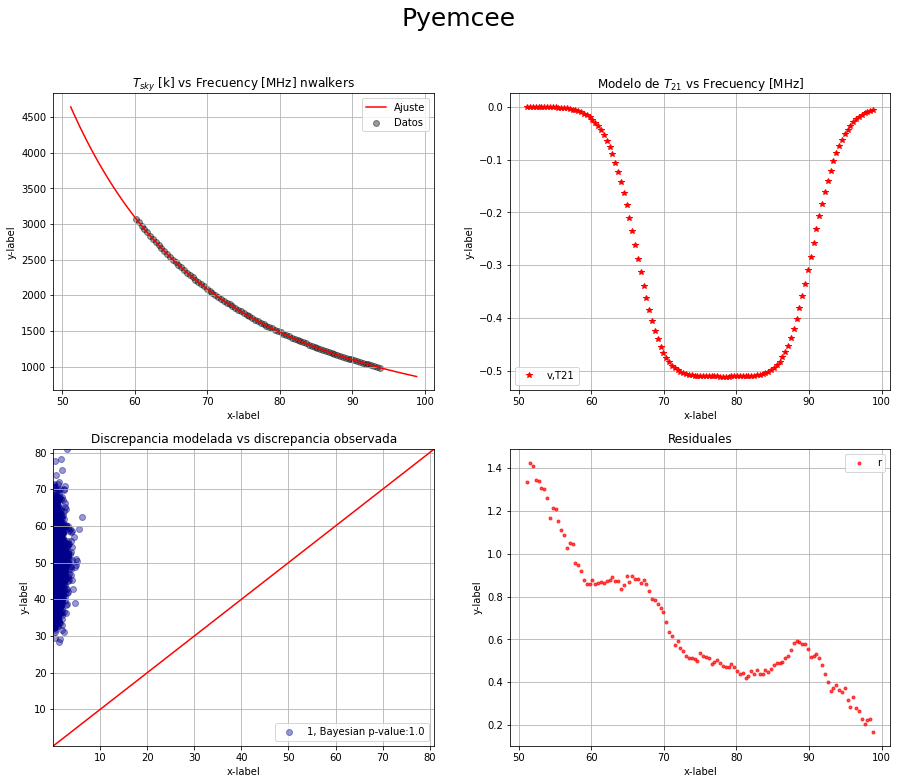

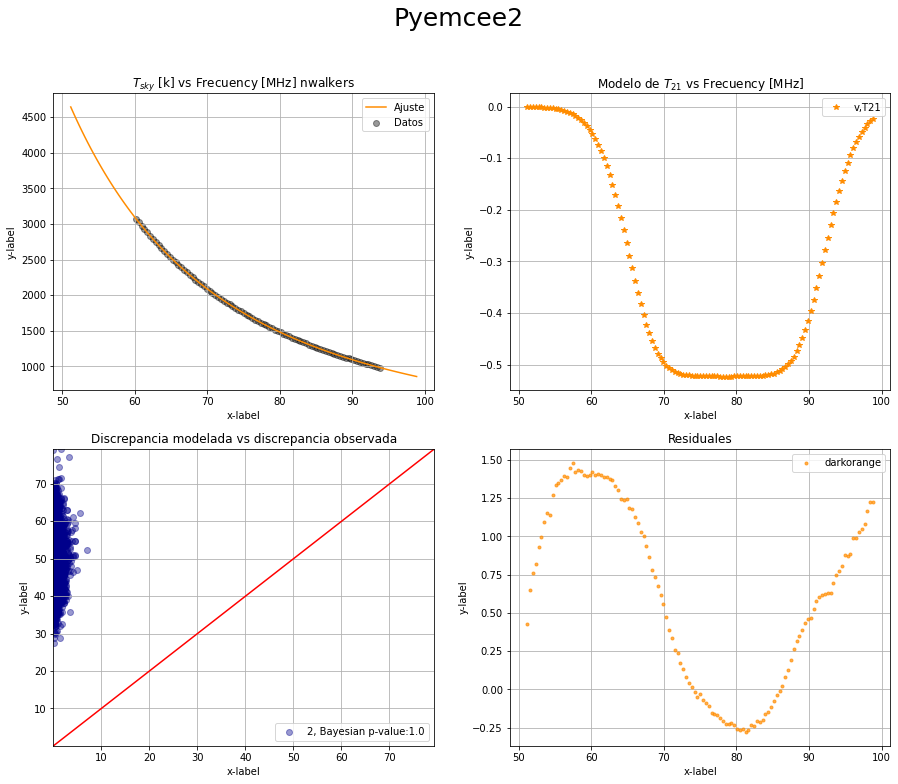

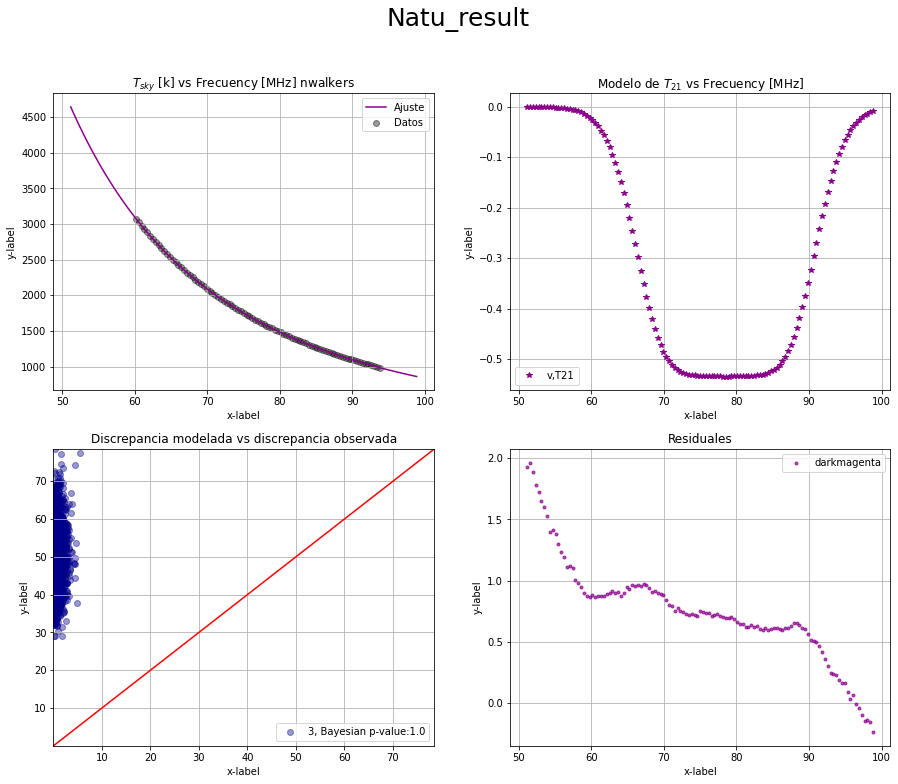

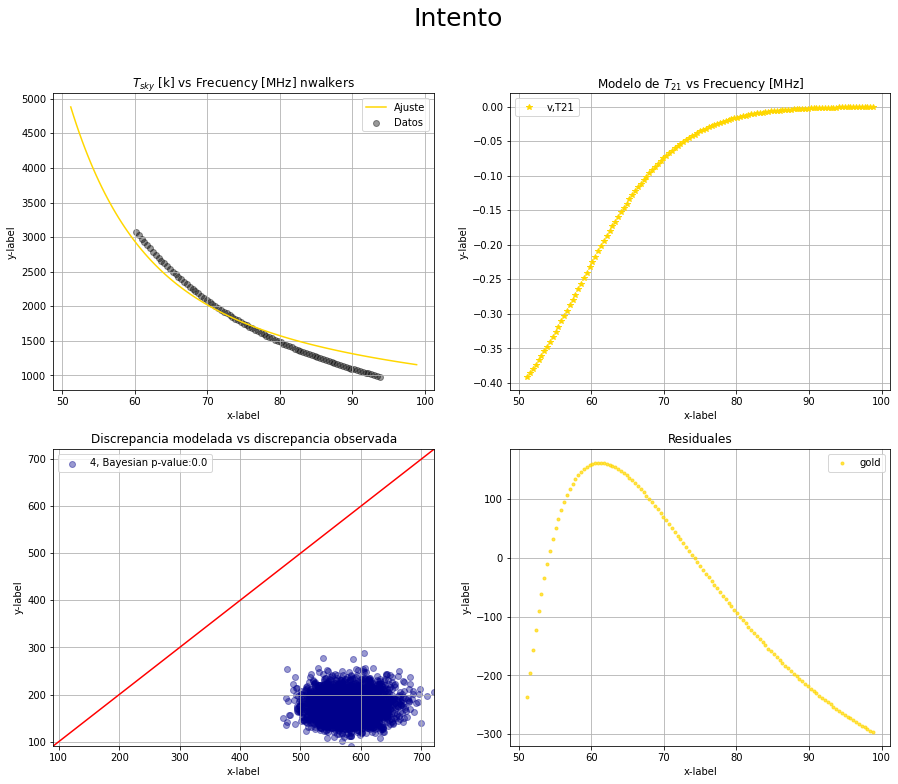

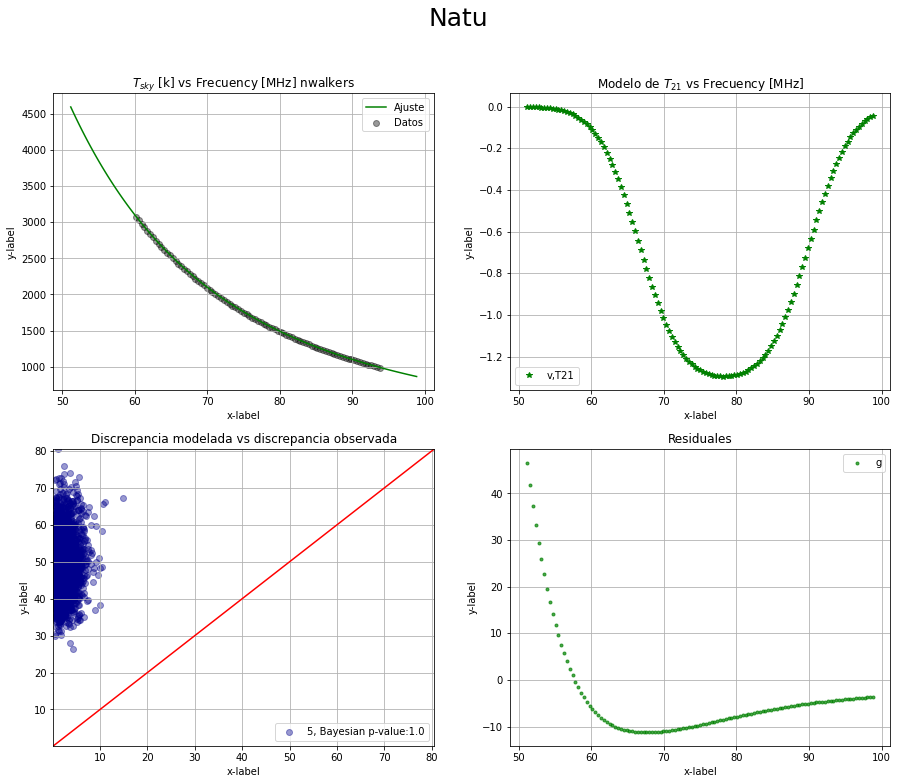

In [ ]:
for i in range(Nlen):
  fig, axs = plt.subplots(2, 2,figsize=(15, 12))
  fig.suptitle(Cons_names[i],fontsize=25)
  a0_,a1_,a2_,a3_,a4_,A1,v01,w1,tau1,sigma1=cc_g3[i]
  axs[0, 0].plot(x,T_sky_s(x,*cc_g3[i]),color=Col[i], label='Ajuste')
  axs[0, 0].scatter(x_C,y_C,color='black',alpha=0.4,label='Datos')
  axs[0, 0].set_title(r'$T_{sky}$ [k] vs Frecuency [MHz] nwalkers')


  axs[0, 1].plot(x,T_21(x,A1,v01,w1,tau1),'k*',label='v,T21',color=Col[i])
  axs[0, 1].set_title(r'Modelo de $T_{21}$ vs Frecuency [MHz]')

  axs[1, 0].scatter(disco_g3[i],discs_g3[i],color='darkblue',alpha=0.4,label=str(i)+", Bayesian p-value:"+str(np.round((disco_g3[i]<discs_g3[i]).sum()*1./len(disco_g3[i]),2)))
  dmax=np.max(np.hstack((disco_g3[i],discs_g3[i])))
  dmin=np.min(np.hstack((disco_g3[i],discs_g3[i])))
  ppp=np.linspace(0,dmax+10,2)
  axs[1, 0].plot(ppp,ppp,c='r')
  axs[1, 0].set_title('Discrepancia modelada vs discrepancia observada')
  axs[1, 0].set_xlim(dmin,dmax)
  axs[1, 0].set_ylim(dmin,dmax)


  axs[1, 1].plot(x,(y-T_sky_s(x,*cc_g3[i])),'.',alpha=0.7,color=Col[i],label=str(Col[i]))
  axs[1, 1].set_title('Residuales')

  for ax in axs.flat:
      ax.set(xlabel='x-label', ylabel='y-label')

  # Hide x labels and tick labels for top plots and y ticks for right plots.
  for ax in axs.flat:
      ax.legend()
      ax.grid()

##Tiempo de autocorrelación

Autocorrelation time for ['a0' 'a1' 'a2' 'a3' 'a4' 'A' 'v0' 'w' 'tau']
Mean:  34.47379291954645 Stdev:  0.0
Mean:  14.633448915012856 Stdev:  5.329070518200751e-15
Mean:  45.74920191602693 Stdev:  0.0
Mean:  34.50542509118349 Stdev:  0.0
Mean:  23.57763473025886 Stdev:  0.0
Mean:  8.289923188176088 Stdev:  1.7763568394002505e-15
Mean:  4.956172127279084 Stdev:  0.0
Mean:  10.157852827727996 Stdev:  3.552713678800501e-15
Mean:  8.502848388946797 Stdev:  1.7763568394002505e-15
Autocorrelation time for ['a0' 'a1' 'a2' 'a3' 'a4' 'A' 'v0' 'w' 'tau']
Mean:  3.092936030140718 Stdev:  4.440892098500626e-16
Mean:  2.146113104764172 Stdev:  4.440892098500626e-16
Mean:  1.3640031537277992 Stdev:  4.440892098500626e-16
Mean:  2.3337171641618957 Stdev:  8.881784197001252e-16
Mean:  3.0557348348450413 Stdev:  8.881784197001252e-16
Mean:  0.8751461219326513 Stdev:  2.220446049250313e-16
Mean:  1.1913069374434428 Stdev:  0.0
Mean:  0.7711619105108874 Stdev:  1.1102230246251565e-16
Mean:  1.09170681091

AutocorrError: ignored

<Figure size 432x432 with 0 Axes>

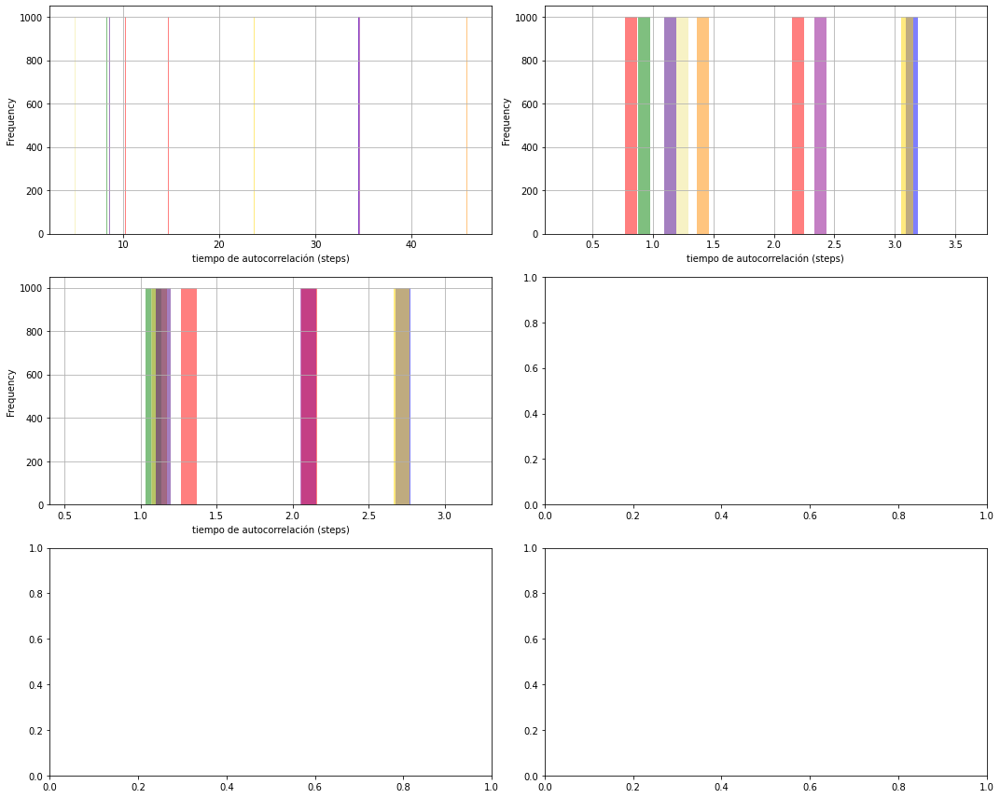

In [ ]:
# Estimate autocorrelation time of the MCMC sampling for the "best" model
plt.figure(figsize=(6,6))
fig, axes = plt.subplots(nrows=3, ncols=2,figsize=(15, 12))
for ii, ax in enumerate(axes.flat, start=0):
  print("Autocorrelation time for "+str(names))
  for j in range(9):
      autocorr=[]
      for i in range(1000):
          autocorr.append(emcee.autocorr.integrated_time(rr_g2[ii,:,j],c=5))
      autocorr=np.asarray(autocorr)
      ax.hist(autocorr,alpha=0.5,color=Col[j])
      print("Mean: ",autocorr.mean(),"Stdev: ",autocorr.std())
      ax.set_xlabel("tiempo de autocorrelación (steps)")
      ax.set_ylabel("Frequency")
      ax.grid()
      fig.tight_layout()
ax.legend(
          names,
          scatterpoints=1,
          loc='upper right',
          ncol=10,
          fontsize=11)

plt.show()

In [ ]:
plt.figure(figsize=(6,6))
fig, axes = plt.subplots(nrows=3, ncols=2,figsize=(15, 12))
for ii, ax in enumerate(axes.flat, start=0):
  print("Autocorrelation time for "+str(names))
  for j in range(9):
      autocorr=[]
      for i in range(2000):
          autocorr.append(emcee.autocorr.integrated_time(rr_g3[ii,:,j],c=5))
      autocorr=np.asarray(autocorr)
      ax.hist(autocorr,alpha=0.5,color=Col[j])
      print("Mean: ",autocorr.mean(),"Stdev: ",autocorr.std())
      ax.set_xlabel("tiempo de autocorrelación (steps)")
      ax.set_ylabel("Frequency")
      ax.grid()
      fig.tight_layout()
ax.legend(
          names,
          scatterpoints=1,
          loc='upper right',
          ncol=10,
          fontsize=11)

plt.show()

In [ ]:
# Estimate autocorrelation time of the MCMC sampling for the "best" model
plt.figure(figsize=(6,6))
fig, axes = plt.subplots(nrows=3, ncols=2,figsize=(15, 12))
for ii, ax in enumerate(axes.flat, start=0):
  print("Autocorrelation time for "+str(names))
  for j in range(9):
      autocorr=[]
      for i in range(100):
          rr_g2=rr_g2[]
          autocorr.append(emcee.autocorr.integrated_time(rr_g2[1,:,j],c=5))
      autocorr=np.asarray(autocorr)
      ax.hist(autocorr,alpha=0.5,color=Col[j])
      print("Mean: ",autocorr.mean(),"Stdev: ",autocorr.std())
      ax.set_xlabel("tiempo de autocorrelación (steps)")
      ax.set_ylabel("Frequency")
      ax.grid()
      fig.tight_layout()
ax.legend(
          names,
          scatterpoints=1,
          loc='upper right',
          ncol=10,
          fontsize=11)

plt.show()

In [ ]:
for i in range(9):
  plt.figure()
  plt.plot(rr_g2[6,:,i],'ko')


In [ ]:
rr_g22=rr_g2[rr_g2[:,:,0]>200]

In [ ]:
rr_g2[0,:,0]